# Финальный проект промышленность

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Нам предстоит построить модель, которая предскажет температуру стали. Работу будем производить в несколько этапов:

1) На первом этапе необходимо изучить данные содержащиеся в файлах которые предоставил заказчик. Это исторические данные полученные во время обработки стали. Изучим данные на пропуски, дубликаты, выбросы, корреляцию, рассмотри распределение данных а так же определим "целевой показатель". По окончанию данного этапа зададим заказчику возникшие вопросы и на основании полученных ответов перейдем к следующему этапу нашей работы

2) На втором этапе мы займемся предобработкой данных: удалим те пропущенные значения которые не сможем восстановить или заполнить, удалим имеющиеся дубликаты объеденим файлы в единый датасет с данными

3) Далее подготовим данные для обучения. Разобьем данные на обучающую и тестовую выборки, выделим целевой показатель

4) Проведем обучение нескольких моделей, выберем модель обучения, которая покажет наилучший результать при кроссвалидации, удовлетворяющий поставленным клиентом критериям, и проверим работу модели на тестовой выборке.

5) Представим клиенту итоговый вариант модели машинного обучения с обоснованием почему именно эта модель была выбрана, дополним работу информативными графиками и выводами сделанными на основании проведенных ихысканий.

## Исследовательский анализ данных

*Для исследовательского анализа исходных данных воспользуемся бибилиотекой pandas_profile для этого установим ее и импортируем необходимые инструменты. Данная библиотека позволяет автоматически создавать отчеты с описанием данных. Отчет включает в себя основные статистические показатели, такие как среднее значение, медиану, минимум, максимум, стандартное отклонение, а также распределение значений, корреляцию между переменными, наличие пропущенных значений и выбросов. Использование данной библиотеки значительно упростит нашу задачу и ускорит ее выполнение*

### Установка бибилиотек и импорт инструментов

In [1]:
!pip install pandas_profiling IPython
!pip install lightgbm

     |████████████████████████████████| 324 kB 1.1 MB/s eta 0:00:01
     |████████████████████████████████| 345 kB 19.2 MB/s eta 0:00:01
     |████████████████████████████████| 679 kB 53.9 MB/s eta 0:00:01
     |████████████████████████████████| 102 kB 73.2 MB/s eta 0:00:01
     |████████████████████████████████| 296 kB 75.7 MB/s eta 0:00:01
     |████████████████████████████████| 6.9 MB 74.1 MB/s eta 0:00:01
     |████████████████████████████████| 2.1 MB 55.5 MB/s eta 0:00:01
     |████████████████████████████████| 4.7 MB 76.0 MB/s eta 0:00:01
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27085 sha256=74caa130b2bfad7cb9301bce54c2fde1e949b56ab7ad83b69955b9216043387f
  Stored in directory: /home/jovyan/.cache/pip/wheels/1d/05/04/c6d7d3b66539d9e659ac6dfe81e2d0fd4c1a8316cc5a403300
Successfully built htmlmin


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')
from functools import reduce
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, make_scorer
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
import lightgbm as lgb
import phik
from IPython.utils import io

/tmp/ipykernel_31/3334527044.py:4: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


### Загрузка данных

In [3]:
data_arc = pd.read_csv('/datasets/data_arc_new.csv')
data_bulk = pd.read_csv('/datasets/data_bulk_new.csv')
data_bulk_time = pd.read_csv('/datasets/data_bulk_time_new.csv')
data_gas = pd.read_csv('/datasets/data_gas_new.csv')
data_temp = pd.read_csv('/datasets/data_temp_new.csv')
data_wire = pd.read_csv('/datasets/data_wire_new.csv')
data_wire_time = pd.read_csv('/datasets/data_wire_time_new.csv')

### Изучение данных

In [4]:
profile_arc = ProfileReport(data_arc, title="Данные об электродах")
display(profile_arc)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
profile_bulk = ProfileReport(data_bulk, title="Данные о подаче сыпучих материалов (объём)")
display(profile_bulk)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
profile_bulk_time = ProfileReport(data_bulk_time, title="Данные о подаче сыпучих материалов (время)")
display(profile_bulk_time)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
profile_gas = ProfileReport(data_gas, title="Данные о продувке сплава газом")
display(profile_gas)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile_temp = ProfileReport(data_temp, title="Результаты измерения температуры")
display(profile_temp)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile_wire = ProfileReport(data_wire, title="Данные о проволочных материалах (объём)")
display(profile_wire)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
profile_wire_time = ProfileReport(data_wire_time, title="Данные о проволочных материалах (время)")
display(profile_wire_time)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Краткие выводы

*В нашем распоряжении 7 файлов с данными:*
- `data_arc_new.csv` — данные об электродах;
- `data_bulk_new.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time_new.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas_new.csv` — данные о продувке сплава газом;
- `data_temp_new.csv` — результаты измерения температуры;
- `data_wire_new.csv` — данные о проволочных материалах (объём);
- `data_wire_time_new.csv` — данные о проволочных материалах (время).


*В данных есть большое количество пропусков, отсутсвуюют дубликаты, есть выбросы данных, распределение данных целевого показателя нормальное среденее и медиана примерно равны*

### Вопросы заказчику


## Предобработка данных

### Предобработка данных

*Приведем к необходимому нам виду все таблицы которые мы будем использовать для обучения моделей*

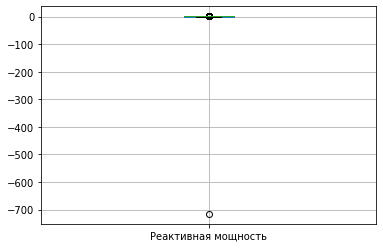

In [4]:
#Построим ящик с усами чтобы увидеть выбросы
data_arc.boxplot(column = 'Реактивная мощность');

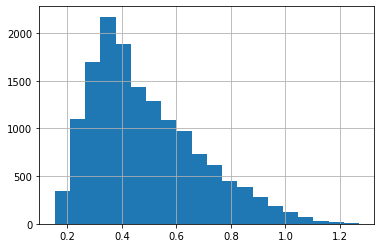

In [5]:
#Во время исследовательского анализа данных нами были обнаружены отрицательные значения реактивной мощности, удалим эти занчения
data_arc = data_arc.query('`Реактивная мощность` >= 0')
data_arc['Реактивная мощность'].hist(bins=20);

Теперь гистограмма стала нагляднее, видим что распределение значение скошено влево

In [6]:
#приведем данные в столбцах со временем начала и конца нагрева дугой к типу datetime
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])
data_arc['Начало нагрева дугой'] =  pd.to_datetime(data_arc['Начало нагрева дугой'])

In [7]:
#Добавим столбец с длительностью нагрева
data_arc['Длительность нагрева'] = (data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']).dt.total_seconds()
                        

In [8]:
#Удалим столбцы с временем начала и конца нагрева
data_arc = data_arc.drop(['Начало нагрева дугой', 'Конец нагрева дугой'], axis=1)

In [9]:
#Суммируем значения мощностей и длительности нагрева разных измерений температуры и перезапишем датасет
data_arc_pivot = (
    data_arc.pivot_table(index = 'key', 
                         values = ['Активная мощность', 'Реактивная мощность', 'Длительность нагрева'], 
                         aggfunc='sum')
    .reindex(columns=['Активная мощность', 'Реактивная мощность', 'Длительность нагрева'])
)
data_arc_pivot.head(5)

,Активная мощность,Реактивная мощность,Длительность нагрева
key,,,
1,3.036730,2.142821,1098.0
2,2.139408,1.453357,811.0
3,4.063641,2.937457,655.0
4,2.706489,2.056992,741.0
5,2.252950,1.687991,869.0


In [10]:
data_bulk.head(5)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


In [11]:
# Отсутствующие значения в данных о подаче сыпучих тел означают что ту или иную добавку не использовали,
# можно все пропущенные значения заменить на ноль
data_bulk.fillna(0, inplace=True)
data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   3129 non-null   float64
 2   Bulk 2   3129 non-null   float64
 3   Bulk 3   3129 non-null   float64
 4   Bulk 4   3129 non-null   float64
 5   Bulk 5   3129 non-null   float64
 6   Bulk 6   3129 non-null   float64
 7   Bulk 7   3129 non-null   float64
 8   Bulk 8   3129 non-null   float64
 9   Bulk 9   3129 non-null   float64
 10  Bulk 10  3129 non-null   float64
 11  Bulk 11  3129 non-null   float64
 12  Bulk 12  3129 non-null   float64
 13  Bulk 13  3129 non-null   float64
 14  Bulk 14  3129 non-null   float64
 15  Bulk 15  3129 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


In [12]:
data_gas.info()
#Нулевых значений нет, а выбросы в виде максимальных значений удалим 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


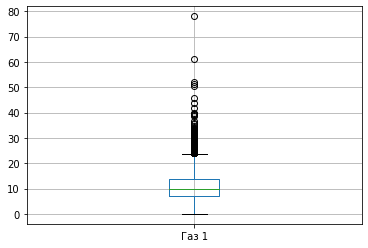

In [13]:
data_gas.boxplot(column = 'Газ 1');

In [14]:
data_gas['Газ 1'].describe()

count    3239.000000
mean       11.002062
std         6.220327
min         0.008399
25%         7.043089
50%         9.836267
75%        13.769915
max        77.995040
Name: Газ 1, dtype: float64

In [15]:
#удалим выбросы значений подачи газа
data_gas = data_gas.query('`Газ 1` < 60')

In [16]:
data_temp.head()

,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0


In [17]:
#удалим все строки с пропущенными значениями замеров температуры
#data_temp.fillna(0, inplace=True)

In [18]:
#Так как нашим целевым признаком я вляется температура розлива то есть последняя замеренная температура 
#и важно понимание на сколько увеличили температуру,
#  с помощью сводной таблицы оставим только  первые и последние значения температуры а так же те значения
#в которых замер температуры производился более одного раза и первый замер не равен последнему
data_temp_pivot = data_temp.pivot_table(index='key', values='Температура', aggfunc = ('first','last', 'count'))
data_temp_pivot = data_temp_pivot.query('count>1 & first != last')
data_temp_pivot.head()

,count,first,last
key,,,
1,6,1571.0,1613.0
2,5,1581.0,1602.0
3,6,1596.0,1599.0
4,5,1601.0,1625.0
5,5,1576.0,1602.0


In [19]:
data_temp_pivot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2433 entries, 1 to 2499
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   count   2433 non-null   int64  
 1   first   2433 non-null   float64
 2   last    2433 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 76.0 KB


In [20]:
#Оставим в данных только ту температуру которая соответсвует температуре розлива сталои
data_temp_pivot = data_temp_pivot.query('last > 1450')

In [21]:
data_temp_pivot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2433 entries, 1 to 2499
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   count   2433 non-null   int64  
 1   first   2433 non-null   float64
 2   last    2433 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 76.0 KB


In [22]:
# Заполним пропущенные значения в данных о добавления проволоки нолями
data_wire.fillna(0, inplace=True)
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3081 non-null   float64
 2   Wire 2  3081 non-null   float64
 3   Wire 3  3081 non-null   float64
 4   Wire 4  3081 non-null   float64
 5   Wire 5  3081 non-null   float64
 6   Wire 6  3081 non-null   float64
 7   Wire 7  3081 non-null   float64
 8   Wire 8  3081 non-null   float64
 9   Wire 9  3081 non-null   float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


*Данные из таблиц со временем добавления сыпучих материалов и проволоки мы использовать не будем, но на будущее если метрика не дотянет до необходимой нам или чтобу еще улучшить ее, как вариант можно сделать столбец со значением времени прошедшего с момента первого измерения температуры до времени добавления вещества. Правда для реализации этого нам необходимо будет сначала объеденить все таблицы и сохранить при этом данные по первому измерению температуры*


### Объединение таблиц

In [23]:
#Проведем склеивание таблиц методом merge() чтобы в итоговую таблицу попали все строки из всех таблиц
df = data_arc_pivot.merge(data_bulk, on='key', how='outer')
df = df.merge(data_gas, on='key', how='outer')
df = df.merge(data_temp_pivot, on='key', how='outer')
data_final = df.merge(data_wire, on='key', how='outer')

In [24]:
#рассмотрим визуально получившуюся таблицу и изучим информацию о ней
pd.set_option('display.max_columns', None)
data_final.head()

,key,Активная мощность,Реактивная мощность,Длительность нагрева,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Газ 1,count,first,last,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,3.036730,2.142821,1098.0,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,29.749986,6.0,1571.0,1613.0,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,2.139408,1.453357,811.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,12.555561,5.0,1581.0,1602.0,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,4.063641,2.937457,655.0,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,28.554793,6.0,1596.0,1599.0,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,2.706489,2.056992,741.0,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,18.841219,5.0,1601.0,1625.0,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,2.252950,1.687991,869.0,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,5.413692,5.0,1576.0,1602.0,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3241 entries, 0 to 3240
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   3241 non-null   int64  
 1   Активная мощность     3214 non-null   float64
 2   Реактивная мощность   3214 non-null   float64
 3   Длительность нагрева  3214 non-null   float64
 4   Bulk 1                3129 non-null   float64
 5   Bulk 2                3129 non-null   float64
 6   Bulk 3                3129 non-null   float64
 7   Bulk 4                3129 non-null   float64
 8   Bulk 5                3129 non-null   float64
 9   Bulk 6                3129 non-null   float64
 10  Bulk 7                3129 non-null   float64
 11  Bulk 8                3129 non-null   float64
 12  Bulk 9                3129 non-null   float64
 13  Bulk 10               3129 non-null   float64
 14  Bulk 11               3129 non-null   float64
 15  Bulk 12              

In [26]:
#удалим из итоговой таблицы строки с пропущенными значениями в столбцах с конечной температурой, объемом газа,
#одного из  сыаучих веществ и из одного типа проволоки проволоки
#отсутствие значений в жтих столбцах означает что для данных разливов не было данных,
#а с учетом того что в таблице с газом не было пропущенных значений, 
#значит в других таблицах есть данные по разливам которых нет в этой
data_final.dropna(subset=['last', 'Газ 1', 'Wire 1', 'Bulk 1'], inplace=True)


In [27]:
#удалим теперь уже не нужный столбуц с номерами партий, для обучения модели он нам не пригодится
data_final = data_final.drop('key', axis=1)

In [28]:
#переименуем столбцы 
data_final = data_final.rename(columns={'Активная мощность':'active_power', 'Реактивная мощность':'reactive_power', 'Длительность нагрева':'Heating_duration', 'Температура':'Temperature', 'Газ 1':'gas','first':'start_temerature', 'last':'end_temperature' })
data_final.columns = data_final.columns.str.lower()

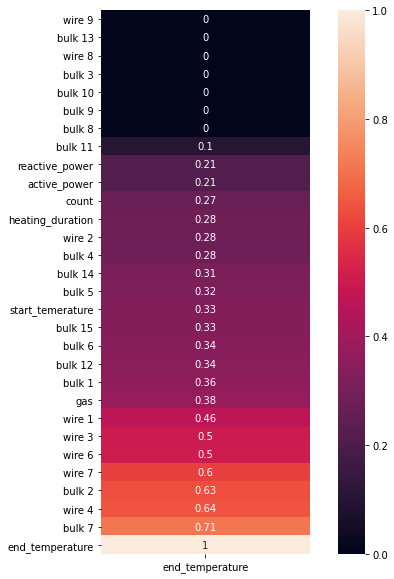

In [29]:
#Изучим корреляцию признаков с целевым показателем с помощью библиотеки phik

plt.figure(figsize=(5, 10))
with io.capture_output() as captured:
    sns.heatmap(data_final.phik_matrix()[['end_temperature']].sort_values('end_temperature'), annot=True, cbar_kws={"pad": 0.1})

In [30]:
#удалим признаки с  корреляцией менее 0,2 с целевым показателем
data_final = data_final.drop(['bulk 11', 'bulk 8',  'bulk 9', 'bulk 10',\
                                    'bulk 3',  'bulk 13',  'wire 9', 'wire 8'], axis=1).reset_index(drop=True)

In [31]:
# Изучим получившуюся итоговую таблицу после склеивания и фильтрации
data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2291 entries, 0 to 2290
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   active_power      2291 non-null   float64
 1   reactive_power    2291 non-null   float64
 2   heating_duration  2291 non-null   float64
 3   bulk 1            2291 non-null   float64
 4   bulk 2            2291 non-null   float64
 5   bulk 4            2291 non-null   float64
 6   bulk 5            2291 non-null   float64
 7   bulk 6            2291 non-null   float64
 8   bulk 7            2291 non-null   float64
 9   bulk 12           2291 non-null   float64
 10  bulk 14           2291 non-null   float64
 11  bulk 15           2291 non-null   float64
 12  gas               2291 non-null   float64
 13  count             2291 non-null   float64
 14  start_temerature  2291 non-null   float64
 15  end_temperature   2291 non-null   float64
 16  wire 1            2291 non-null   float64


***Получили таблицу состоящую из 23 столбцов и 2291 строку, каждая строка отражает исторические данные по одному наблюдению,
в столбцах содержатся целевой показатель end_temperature, показывающий температуру при которой разливается полученный сплав, и 22 признака на основании которых мы будем предсказывать температуру розлива.***

**Мы провели предобработку исходных данных: привели все датасеты к единому формату где каждый из показателей соответствует одному значению key; удалили явные выбросы значений, значения розлива с отсутсвующим показателем конечной температуры; заполнили нолями все пропущенные значения и объеденили в одну таблицу признаков все, кроме таблиц со временем добавления сыпучих веществ и проволок удалили столбцы которые не будут использоваться при обучении, так же удалили признаки не валияющие на обучение моделей**

**Теперь можно переходить к следующему этапу - опучение различных моделей**

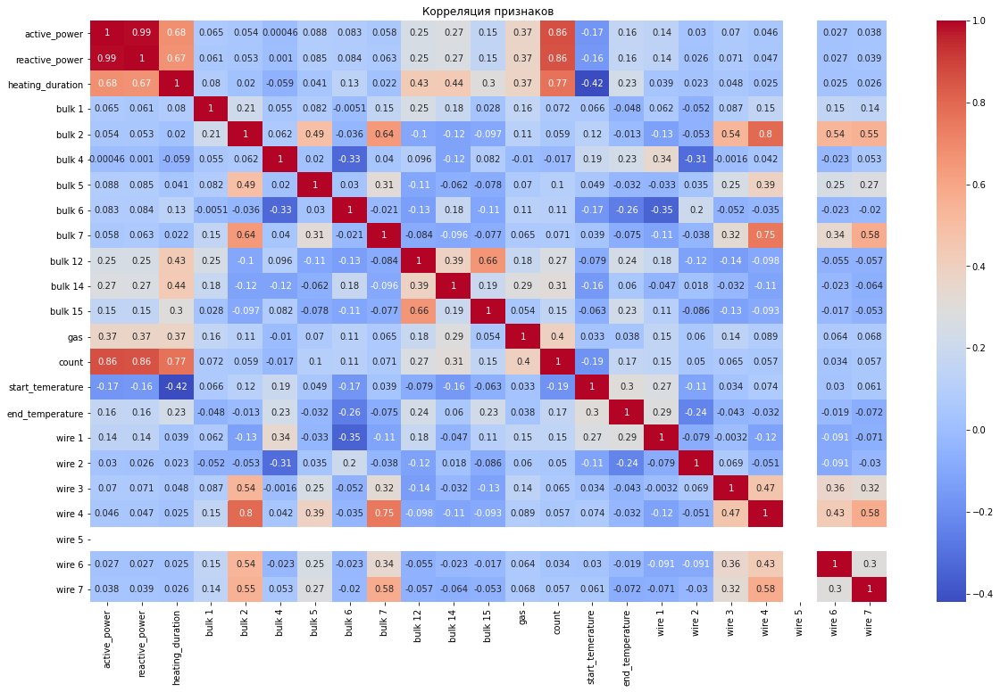

In [34]:
plt.figure(figsize=(20, 12))
plt.title('Корреляция признаков')
sns.heatmap(data_final.corr(method='spearman'), annot = True, cmap="coolwarm")
plt.show()

In [33]:
#хитмап показал корреляцию выше 0,9 между признаким активной и реактивной энергии, удалим признак реактивной энергии
data_final = data_final.drop('reactive_power', axis=1)

## Обучение моделей

### Разделение данных на выборки

In [34]:
# разделим дататсет на признаки и целевой показатель
features = data_final.drop(['end_temperature', 'wire 5'], axis = 1)
target = data_final['end_temperature']

In [35]:
#подготовим тренирочную и тестовую выборки для тестовой выборки выделим 25% данных
features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=80523)

### Обучение модели линейной регрессии

In [36]:
#Для правильной работы модели линейной регресси масштабируем признауи с помощью StandartScaler
scaler = StandardScaler()
scaler.fit(features_train)
scaled_features_train = scaler.transform(features_train)


In [37]:
model_lr = LinearRegression()
model_lr.fit(scaled_features_train, target_train)
model_lr.predict(scaled_features_train)

array([1595.82983516, 1593.5210434 , 1597.24187494, ..., 1597.51100031,
       1606.26638337, 1593.29780028])

In [38]:
kf = KFold(n_splits=5)
mae = make_scorer(mean_absolute_error)
scores = cross_val_score(model_lr, scaled_features_train, target_train, cv=kf, scoring=mae)
print("Средняя оценка MAE: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Средняя оценка MAE: 6.67 (+/- 0.32)


*Значение метрики модели линейной регрессии уже удовлетворяет условиям поставленным заказчиков, но мы должны проверить работу и других моделей, все таки значение на грани максимально допустимого*

### Обучение модели CatBoost


In [41]:
model_cb = CatBoostRegressor(random_seed=80523, loss_function='RMSE', silent=False)
params = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.2, 0.3],
    'iterations': [50, 100],
    'l2_leaf_reg': [1, 3, 5]
}
mae = make_scorer(mean_absolute_error)
grid_model_cb = GridSearchCV(estimator=model_cb, param_grid=params, cv=3, scoring=mae, n_jobs=-1)

In [42]:
grid_model_cb.fit(features_train, target_train)

0:	learn: 11.2318064	total: 47.2ms	remaining: 2.31s
1:	learn: 11.0211245	total: 48.1ms	remaining: 1.15s
2:	learn: 10.8568347	total: 48.8ms	remaining: 765ms
3:	learn: 10.6589680	total: 49.5ms	remaining: 570ms
4:	learn: 10.4639458	total: 50.5ms	remaining: 454ms
5:	learn: 10.3217712	total: 51.2ms	remaining: 376ms
6:	learn: 10.1667403	total: 52.1ms	remaining: 320ms
7:	learn: 10.0648865	total: 52.8ms	remaining: 277ms
8:	learn: 9.9274225	total: 53.6ms	remaining: 244ms
9:	learn: 9.8101741	total: 54.5ms	remaining: 218ms
10:	learn: 9.7277951	total: 55.3ms	remaining: 196ms
11:	learn: 9.6225390	total: 56ms	remaining: 177ms
12:	learn: 9.5459389	total: 56.8ms	remaining: 162ms
13:	learn: 9.5121857	total: 57.5ms	remaining: 148ms
14:	learn: 9.4179530	total: 58.2ms	remaining: 136ms
15:	learn: 9.3733135	total: 59ms	remaining: 125ms
16:	learn: 9.2881572	total: 59.7ms	remaining: 116ms
17:	learn: 9.2030035	total: 60.4ms	remaining: 107ms
18:	learn: 9.1361132	total: 61.1ms	remaining: 99.8ms
19:	learn: 9.0940

GridSearchCV(cv=3,
             estimator=<catboost.core.CatBoostRegressor object at 0x7fc19078e3d0>,
             n_jobs=-1,
             param_grid={'iterations': [50, 100], 'l2_leaf_reg': [1, 3, 5],
                         'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [3, 5, 7]},
             scoring=make_scorer(mean_absolute_error))

In [43]:
grid_model_cb.best_params_

{'iterations': 100, 'l2_leaf_reg': 1, 'learning_rate': 0.3, 'max_depth': 7}

In [44]:
best_model_cb = grid_model_cb.best_estimator_
best_model_cb.fit(features_train, target_train)

0:	learn: 10.3296392	total: 4.48ms	remaining: 444ms
1:	learn: 9.5914704	total: 8.94ms	remaining: 438ms
2:	learn: 9.1590130	total: 13ms	remaining: 420ms
3:	learn: 8.7600752	total: 16.9ms	remaining: 405ms
4:	learn: 8.5508147	total: 20.7ms	remaining: 393ms
5:	learn: 8.3284344	total: 24.9ms	remaining: 389ms
6:	learn: 8.1983406	total: 28.9ms	remaining: 384ms
7:	learn: 8.1037385	total: 32.8ms	remaining: 377ms
8:	learn: 7.9877345	total: 36.9ms	remaining: 373ms
9:	learn: 7.8437339	total: 40.9ms	remaining: 368ms
10:	learn: 7.6863356	total: 44.9ms	remaining: 364ms
11:	learn: 7.6187615	total: 49ms	remaining: 359ms
12:	learn: 7.5206668	total: 52.9ms	remaining: 354ms
13:	learn: 7.4271289	total: 57.2ms	remaining: 351ms
14:	learn: 7.3621716	total: 61.8ms	remaining: 350ms
15:	learn: 7.2767985	total: 66.1ms	remaining: 347ms
16:	learn: 7.2074249	total: 70.3ms	remaining: 343ms
17:	learn: 7.1454139	total: 74.1ms	remaining: 338ms
18:	learn: 7.0851968	total: 78ms	remaining: 333ms
19:	learn: 7.0387182	total:

In [45]:
predict_train_cb = best_model_cb.predict(features_train)

In [46]:
kf = KFold(n_splits=5)
mae = make_scorer(mean_absolute_error)
scores = cross_val_score(best_model_cb, features_train, target_train, cv=kf, scoring=mae)
print("Средняя оценка MAE: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

0:	learn: 10.4389534	total: 4.88ms	remaining: 483ms
1:	learn: 9.7326919	total: 9.41ms	remaining: 461ms
2:	learn: 9.2763841	total: 13.7ms	remaining: 442ms
3:	learn: 8.8836865	total: 17.9ms	remaining: 430ms
4:	learn: 8.6067957	total: 22.4ms	remaining: 426ms
5:	learn: 8.2394479	total: 27.1ms	remaining: 425ms
6:	learn: 8.0637791	total: 32.5ms	remaining: 431ms
7:	learn: 7.8596520	total: 36.8ms	remaining: 423ms
8:	learn: 7.6800182	total: 40.7ms	remaining: 411ms
9:	learn: 7.5285892	total: 44.6ms	remaining: 402ms
10:	learn: 7.4223143	total: 49.2ms	remaining: 398ms
11:	learn: 7.3215357	total: 53.1ms	remaining: 390ms
12:	learn: 7.2354374	total: 57.5ms	remaining: 385ms
13:	learn: 7.1444599	total: 61.7ms	remaining: 379ms
14:	learn: 7.0462785	total: 66.2ms	remaining: 375ms
15:	learn: 6.9593556	total: 70.4ms	remaining: 369ms
16:	learn: 6.8960177	total: 75ms	remaining: 366ms
17:	learn: 6.7807035	total: 79.1ms	remaining: 360ms
18:	learn: 6.7237046	total: 83.2ms	remaining: 355ms
19:	learn: 6.6742420	to

*Значение MAE  модели CatBoost незначительно лучше, всего на 0.02, проверим еще одну модель*

### Обучение модели Lgbm

In [47]:
model_lgbm = LGBMRegressor()
params_lgbm = {
    'learning_rate': [0.1, 0.2, 0.3],
    'n_estimators': [100, 500],
    'num_leaves': [10, 20, 30],
    'max_depth': [5, 10, 15],
}

grid_model_lgbm = GridSearchCV(model_lgbm, params_lgbm, scoring=mae, cv=3, verbose=1, n_jobs=-1)
grid_model_lgbm.fit(features_train, target_train)

print('Лучшие параметры', grid_model_lgbm.best_params_)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Лучшие параметры {'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 500, 'num_leaves': 10}


In [48]:
best_model_lgbm = grid_model_lgbm.best_estimator_
best_model_lgbm.fit(features_train, target_train)
predict_test_lgbm = best_model_lgbm.predict(features_train)
scores = cross_val_score(best_model_lgbm, features_train, target_train, cv=kf, scoring=mae)
print("Средняя оценка MAE: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Средняя оценка MAE: 7.11 (+/- 0.77)


In [53]:
results = {
    'Модели' : ['LightGBM', 'Catboost', 'Линейная регрессия'],
    'MAE на тренировочной выборке' :pd.Series([7.11, 6.68, 6.67]),
     }
display(pd.DataFrame(results))

,Модели,MAE на тренировочной выборке
0,LightGBM,7.11
1,Catboost,6.68
2,Линейная регрессия,6.67


*Модель LGBM показала наихудшее значение из трех рассмотренных нами моделей*

***Итак мы обучили модель Линейной регрессии, подобрали лучшие параметры для моделей CatBoost и LGBM, проверили их работу на тренировочной выборке данных и определили средние значение метрики MAE при кроссвалидации. По итогам исследования луший показатель у модели Линейной регрессии, именно ее  с лучшими подобранными параметрами, мы будем проверять на тестовой выборке***

## Проверка лучшей модели на тестовой выборке

### Проверка модели на тестовой выборке

In [54]:
#best_model_cb = grid_model_cb.best_estimator_
#predict_test_cb = best_model_cb.predict(features_test)
#MAE = mean_absolute_error(target_test, predict_test_cb)
#print('MAE лучшей модели CatBoost: ', MAE)

In [58]:
scaler.fit(features_test)
scaled_features_test = scaler.transform(features_test)

In [60]:
predict_test_lr = model_lr.predict(scaled_features_test)
MAE = mean_absolute_error(target_test, predict_test_lr)
print('MAE Линейной регрессии на тестовой выборке: ', MAE)

MAE Линейной регрессии на тестовой выборке:  6.472595609933652


***Наша лучша, по итогам исследования, модель на тестовой выборке показала результат MAE 6,47, это более чем удовлетворяет нашим требованиям, данную модель можно передавть заказчику, но прежде изучим важность признаков для обучения нашей модели, исходя их того какие признаки играют бОльшую роль в обучении можно настроить получение имменно важных показателей***

### Важность признаков

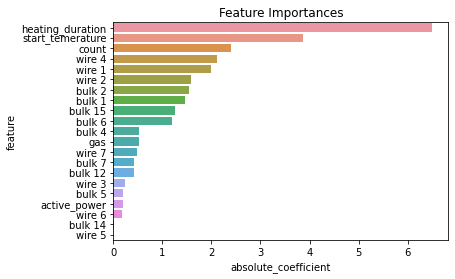

In [62]:
# получаем коэффициенты модели
coefficients = model_lr.coef_

# создаем датафрейм с коэффициентами признаков
importance_df = pd.DataFrame({'feature': features_train.columns, 'coefficient': coefficients})
importance_df['absolute_coefficient'] = importance_df['coefficient'].abs()
importance_df = importance_df.sort_values('absolute_coefficient', ascending=False)

# выводим на экран график с важностями признаков
sns.barplot(x='absolute_coefficient', y='feature', data=importance_df)
plt.title('Feature Importances')
plt.show()

***Полученный график очень наглядно показывает что для предсказания конечной температуры очень вожны такие показатели как длительность нагрева, температура при первом измерении, оббем добавления wire 4 и количество замеров температуры, далее по убыванию показатели объема добаления различных веществ и проволоки а так же активной и реактивной энергии, объем веществ которые добавлялись очень малое количесвто практически не влияют на качество предсказания модели. При этом некорые из них мы удалили еще на стадии формирования единой таблицы из за их нудевой корреляции с целевым показателем***

## Отчет о проделанной работе

**Перед нами была поставлена задача написания модели машинного обучения которая предсказывала бы достижение температуры оптимальной для начала розлива сплава стали, чтбы предприятие могло сэкономить электроэнергию потраченную на лишний нагрев свыше необходимой температуры.**

**Мы провели работу согласно плану предоставленному заказчику: изучили данные которые полчаются в автоматическом режиме в процессе нагрева и добавления различных веществ, провели предобработку этих данных, заполнили пропуски, удалили экстремальные показатели и объеденили из в одну таблицу которую в дальнейшем использовали для обучени. На следующем этапе мы протестировали на обучающей выборке три различные модели: Линейную регрессию, CatBoost и LGBM, наилучший результат предсказания на тренировочной выборке показала модель Линейной регрессии, именно ее мы проверили на тестовой выборе и значение метрики MAE равное 6.49 вполне удовлетворяет поставленным заказчиком требованиям. Данную модель можно передавать заказчику**